In [2]:
import numpy as np
import ipyvolume as ipv

import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, Layout, Button, Layout, HBox, VBox, Label, FloatSlider, ColorPicker, jslink
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
print(__version__) # requires version >= 1.9.0
init_notebook_mode(connected=True)
%config InlineBackend.figure_format = 'retina'

2.2.1


In [3]:
from matplotlib import pyplot as plt
%matplotlib inline

Magnetic field produced by a dipole is [(see wikipedia)](https://en.wikipedia.org/wiki/Magnetic_dipole):

$$\mathbf{B}({\mathbf{r}}) = \frac{\mu_{0}}{4\pi}\left(\frac{3\mathbf{r}(\mathbf{m}\cdot\mathbf{r})}{r^{5}} - \frac{{\mathbf{m}}}{r^{3}}\right)$$


According to [WolframAlpha](http://www.wolframalpha.com/input/?i=%CE%BC0):
$$\mu_{0} = \frac{\pi}{2.5 \cdot 10^6}\ \frac{\mathrm{N}}{\mathrm{A}^2}$$

$$\frac{\mu_{0}}{4\pi} = \frac{\pi}{4 \pi \cdot 2.5 \cdot 10^6} = 10^{-7}\, \frac{\mathrm{H}}{\mathrm{m}}$$

In [4]:
def dipole(m, r, r0):
    """Calculate a field in point r created by a dipole moment m located in r0.
    Spatial components are the outermost axis of r and returned B.
    """
    # we use np.subtract to allow r and r0 to be a python lists, not only np.array
    R = np.subtract(np.transpose(r), r0).T
    
    # assume that the spatial components of r are the outermost axis
    norm_R = np.sqrt(np.einsum("i...,i...", R, R))
    
    # calculate the dot product only for the outermost axis,
    # that is the spatial components
    m_dot_R = np.tensordot(m, R, axes=1)

    # tensordot with axes=0 does a general outer product - we want no sum
    B = 3 * m_dot_R * R / norm_R**5 - np.tensordot(m, 1 / norm_R**3, axes=0)
    
    # include the physical constant, approximated here
    B *= 1e-7

    return B

Magnetic field produced by a dipole is [(see wikipedia)](https://en.wikipedia.org/wiki/Magnetic_dipole):
    
    
$$\mathbf{B}({\mathbf{r}}) = \frac{\mu_{0}}{4\pi}\left(\frac{3\mathbf{r}(\mathbf{m}\cdot\mathbf{r})}{r^{5}} - \frac{{\mathbf{m}}}{r^{3}}\right)$$

With a [simplication](https://www.researchgate.net/post/Magnetic_field_around_a_dipole):
    
In SI units, the B field (vector) of a dipole m is :
     B(r) = (µ0/4pi) [ 3 r (m · r) / r5  -  m / r3 ]
      
with $$\mathbf{r} = \left(r_{x},r_{y},r_{z}\right) $$
with r = [x,y,z] 
$$\mathbf{m} = [m_{x},m_{y},m_{z}] $$

$$ r = ({x^{2}}+{y^{2}}+{z^{2}})^{1/2} $$


and for a dipole in z direction we have $m = \left(0,0,m_{z}\right)$ and $ m \cdot\ r = m_{z} r_{z}$

So, this should result in:
      
$$ B_{x}(r) = \frac{\mu_{0}}{4\pi} \left( \frac{3 r_{x} (m_{z} r_{z})} {r^{5}} \right) 
= \frac{3 \mu_{0}}{4\pi} \left( \frac{r_{x} (m_{z} r_{z})} {r^{5}} \right) $$
      

$$ B_{y}(r) = \frac{\mu_{0}}{4\pi} \left( \frac{3 r_{y} (m_{z} r_{z})}  {r^{5}} \right)
= \frac{3 \mu_{0}}{4\pi} \left( \frac{r_{y} (m_{z} r_{z})}  {r^{5}} \right) $$
      
        
$$B_{z}(r) = \frac{\mu_{0}}{4\pi} \left( \frac{3 r_{z} (m_{z} r_{z})} {r^{5}} - \frac{m_{z}} {r^{3}} \right) 
= \frac{\mu_{0} }{4\pi} \frac{m_{z}}{r^{3}} \left( \frac{3 r_{z}^{2}} {r^{2}} - 1 \right) 
 $$


    

In [5]:
# x, y, z: location of the observing point
# Bx, By, Bz: vector B field at the observing point in vaccum
def VerticalMagneticDipoleField(x, y, z):
    r = (x**2 + y**2 + z**2)**(0.5)
    Bx = 1e-7/r**3 * 3*x*z/r**2
    By = 1e-7/r**3 * 3*y*z/r**2
    Bz = 1e-7/r**3 * (3*z**2/r**2 - 1)
    return Bx, By, Bz


In [6]:
from tempfile import TemporaryFile
outfile = TemporaryFile()
x = np.arange(10)
np.save(outfile, x)
outfile.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile)
#array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [7]:
import numpy as np
from matplotlib import pyplot as plt

%matplotlib inline

Text(0.5,1,'Compare 3D ')

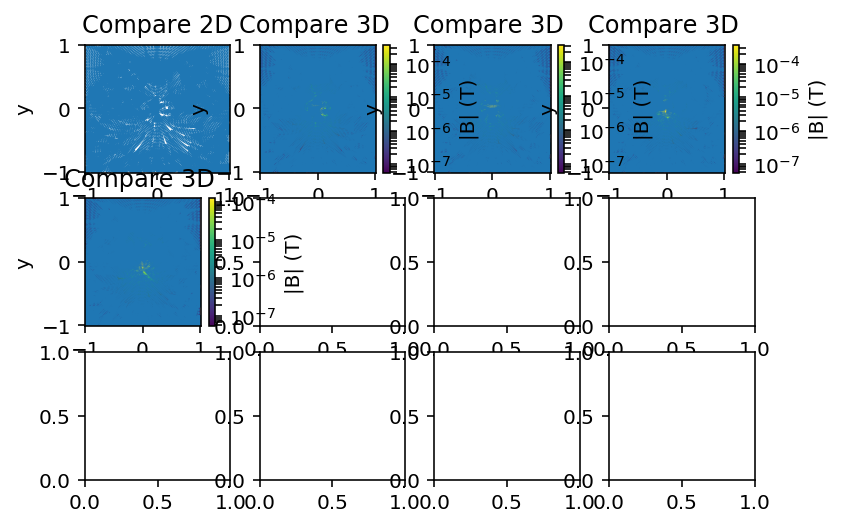

In [21]:
from matplotlib.colors import LogNorm

numberOfValues  = 20
# Check that one of the values will not be 0


X = np.linspace(-1, 1, numberOfValues)
Y = np.linspace(-1, 1, numberOfValues)

#Z = np.linspace(-1, 1)
Z0=0.01
Z1=0.025
Z2=0.05
Z3=0.07
Z4=0.1
Z5=0.25
Z6=0.5
Z7=0.75
Z8=1.0
Z9=1.5
Z10=2.0

#m=[0.0, 0.0, 1.0]
myDipoleMoment_M = [0.0, 1.0, 0.0]
#r0=[0.0,0.0, 0.0]
myDipolePosition_R0 = [0.0,0.0, 0.0]

Bx, By = dipole(m=[0, 1.0], r=np.meshgrid(X, Y), r0=[-0.2,0.1])
Bx_simple0_2D, By_simple0_2D = dipole(m=[0, 1.0], r=np.meshgrid(X, Y), r0=[-0.0,0.0])

#Bx_simple0_3D, By_simple0_3D, Bz_simple0_3D = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X, Y, Z0), r0=[0.0,0.0, 0.0])
Bx_simple0_3D, By_simple0_3D, Bz_simple0_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z0), r0=myDipolePosition_R0)
Bx_simple1_3D, By_simple1_3D, Bz_simple1_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z1), r0=myDipolePosition_R0)
Bx_simple2_3D, By_simple2_3D, Bz_simple2_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z2), r0=myDipolePosition_R0)
Bx_simple3_3D, By_simple3_3D, Bz_simple3_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z3), r0=myDipolePosition_R0)
Bx_simple4_3D, By_simple4_3D, Bz_simple4_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z4), r0=myDipolePosition_R0)
Bx_simple5_3D, By_simple5_3D, Bz_simple5_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z5), r0=myDipolePosition_R0)
Bx_simple6_3D, By_simple6_3D, Bz_simple6_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z6), r0=myDipolePosition_R0)
Bx_simple7_3D, By_simple7_3D, Bz_simple7_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z7), r0=myDipolePosition_R0)
Bx_simple8_3D, By_simple8_3D, Bz_simple8_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z8), r0=myDipolePosition_R0)
Bx_simple9_3D, By_simple9_3D, Bz_simple9_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z9), r0=myDipolePosition_R0)
Bx_simple10_3D, By_simple10_3D, Bz_simple10_3D = dipole(myDipoleMoment_M, r=np.meshgrid(X, Y, Z10), r0=myDipolePosition_R0)


Bx_simpleFormula_3D, By_simpleFormula_3D, Bz_simpleFormula3D = VerticalMagneticDipoleField(X, Y, Z0)
#print(Bx)
#print(Bx_simpleFormula_3D)
#print(Bx_simple0_3D)

#x1, y1 = np.random.random(-1,1)
x1 = np.linspace(-1, 1, numberOfValues)
y1 = np.linspace(-1, 1, numberOfValues)
z1 = np.linspace(-1, 1, numberOfValues)
#print(x1)
#print(y1)
Bx_simple_3D, By_simple_3D, Bz_simple3D = VerticalMagneticDipoleField(x1, y1, z1)
#print(Bx_simple0_2D)
#print(Bx_simple0_3D)
#print(Bx_simple_3D)


#plt.figure(figsize=(8, 8))
#plt.streamplot(X, Y, Bx, By)
#plt.margins(0, 0)

#def draw(XYZ=None, loc=np.r_[0., 0., 0.], sig=1.0, freq=1.0, orientation='Z',
#        plotIt=True, ax):


    #if XYZ is None:
        # avoid putting measurement points where source is
        #x = np.arange(-100.5, 100.5, step=1.)
        #y = np.r_[0]
        #z = x
        #XYZ = Utils.ndgrid(x, y, z)

    #Bx, By, Bz = EM.Analytics.FDEM.MagneticDipoleWholeSpace(
    #    XYZ,
    #    loc,
    #    sig,
    #    freq,
    #    orientation=orientation
    #)
    #absB = np.sqrt(Bx*Bx.conj()+By*By.conj()+Bz*Bz.conj()).real

    #if plotIt:
    #    pc = ax.pcolor(x, z, absB.reshape(x.size, z.size), norm=LogNorm())
    #    ax.streamplot(x, z, bxplt.real, bzplt.real, color='k', density=1)
    #    ax.set_xlim([x.min(), x.max()])
    #    ax.set_ylim([z.min(), z.max()])
    #    ax.set_xlabel('x')
    #    ax.set_ylabel('z')
    #    cb = plt.colorbar(pc, ax=ax)
    #    cb.set_label('|B| (T)')


    #   return Bx, By, Bz



figure1, ax_1 = plt.subplots(3,4,figsize=(20, 15))
#figure1, ax_1 = plt.subplots(3,4) # ugly!
myPCList = [i for i in range(10)]
myCBList = [i for i in range(10)]
#ZDisplayList = [i for i in range(10)]
ZDisplayList =  {0.01, 0.025, 0.05, 0.07, 0.1, 0.25, 0.5, 0.75, 1.0, 1.5, 2.0}
absB = [i for i in range(10)]

#ax_1[0,0].streamplot(X, Y, Bx, By, density=3)
#ax_1[0,0].margins(0, 0)
#ax_1[0,0].set_title('Original')

# ax[1,1] = fig.gca(projection='3d')
# ax[0,1].streamplot(X, Y, Bx3D, By3D, density=3)
#ax[0,1].quiver(X, Y, B3D[0], B3D[1])
ax_1[0,0].streamplot(X, Y, Bx_simple0_2D, By_simple0_2D, density=3)
ax_1[0,0].margins(0, 0)


ax_1[0,0].set_xlabel('x')
ax_1[0,0].set_ylabel('y')
#absB[0] = np.sqrt(Bx_simple3_3D.reshape(numberOfValues,-1)*Bx_simple3_3D.reshape(numberOfValues,-1).conj()+By_simple3_3D.reshape(numberOfValues,-1)*By_simple3_3D.reshape(numberOfValues,-1).conj()+Bz_simple3_3D.reshape(numberOfValues,-1)*Bz_simple3_3D.reshape(numberOfValues,-1).conj()).real
#myPCList[0] = ax_1[0,0].pcolormesh(X, Y, absB[0], norm=LogNorm(), shading="gouraud")
#myCBList[0] = plt.colorbar(myPCList[0], ax=ax_1[0,0])
#myCBList[0].set_label('|B| (T)')

ax_1[0,0].set_title('Compare 2D')



ax_1[0,1].streamplot(X, Y, Bx_simple0_3D.reshape(numberOfValues,-1), By_simple0_3D.reshape(numberOfValues,-1), density=3)
ax_1[0,1].margins(0, 0)

ax_1[0,1].set_xlabel('x')
ax_1[0,1].set_ylabel('y')
absB[1] = np.sqrt(Bx_simple0_3D.reshape(numberOfValues,-1)*Bx_simple0_3D.reshape(numberOfValues,-1).conj()+By_simple0_3D.reshape(numberOfValues,-1)*By_simple0_3D.reshape(numberOfValues,-1).conj()+Bz_simple0_3D.reshape(numberOfValues,-1)*Bz_simple0_3D.reshape(numberOfValues,-1).conj()).real
myPCList[1] = ax_1[0,1].pcolormesh(X, Y, absB[1], norm=LogNorm(), shading="gouraud")
myCBList[1] = plt.colorbar(myPCList[1], ax=ax_1[0,1])
myCBList[1].set_label('|B| (T)')

ax_1[0,1].set_title('Compare 3D ')



ax_1[0,2].streamplot(X, Y, Bx_simple1_3D.reshape(numberOfValues,-1), By_simple1_3D.reshape(numberOfValues,-1), density=3)
ax_1[0,2].margins(0, 0)

ax_1[0,2].set_xlabel('x')
ax_1[0,2].set_ylabel('y')
absB[2] = np.sqrt(Bx_simple1_3D.reshape(numberOfValues,-1)*Bx_simple1_3D.reshape(numberOfValues,-1).conj()+By_simple1_3D.reshape(numberOfValues,-1)*By_simple1_3D.reshape(numberOfValues,-1).conj()+Bz_simple1_3D.reshape(numberOfValues,-1)*Bz_simple1_3D.reshape(numberOfValues,-1).conj()).real
myPCList[2] = ax_1[0,2].pcolormesh(X, Y, absB[2], norm=LogNorm(), shading="gouraud")
myCBList[2] = plt.colorbar(myPCList[2], ax=ax_1[0,2])
myCBList[2].set_label('|B| (T)')

ax_1[0,2].set_title('Compare 3D ')




ax_1[0,3].streamplot(X, Y, Bx_simple2_3D.reshape(numberOfValues,-1), By_simple2_3D.reshape(numberOfValues,-1), density=3)
ax_1[0,3].margins(0, 0)

ax_1[0,3].set_xlabel('x')
ax_1[0,3].set_ylabel('y')
absB[3] = np.sqrt(Bx_simple0_3D.reshape(numberOfValues,-1)*Bx_simple0_3D.reshape(numberOfValues,-1).conj()+By_simple0_3D.reshape(numberOfValues,-1)*By_simple0_3D.reshape(numberOfValues,-1).conj()+Bz_simple0_3D.reshape(numberOfValues,-1)*Bz_simple0_3D.reshape(numberOfValues,-1).conj()).real
myPCList[3] = ax_1[0,3].pcolormesh(X, Y, absB[3], norm=LogNorm(), shading="gouraud")
myCBList[3] = plt.colorbar(myPCList[3], ax=ax_1[0,3])
myCBList[3].set_label('|B| (T)')

ax_1[0,3].set_title('Compare 3D ')


#bxplt = Bx.reshape(x.size, z.size)
#bzplt = Bz.reshape(x.size, z.size)
#absB = np.sqrt(Bx*Bx.conj()+By*By.conj()+Bz*Bz.conj()).real


#ax_1[1,0].pcolor(X, Y, absB, cmap='RdBu', vmin=z_min, vmax=z_max)
#pc = ax_1[1,0].pcolor(X, Z, absB.reshape(X.size, Z.size), norm=LogNorm())
#ax.streamplot(x, z, bxplt.real, bzplt.real, color='k', density=1)
#ax.set_xlim([x.min(), x.max()])
#ax.set_ylim([z.min(), z.max()])
#ax.set_xlabel('x')
#ax.set_ylabel('z')
#cb = plt.colorbar(pc, ax=ax)
#cb.set_label('|B| (T)')

ax_1[1,0].streamplot(X, Y, Bx_simple3_3D.reshape(numberOfValues,-1), By_simple3_3D.reshape(numberOfValues,-1), density=3)
ax_1[1,0].margins(0, 0)
ax_1[1,0].set_xlabel('x')
ax_1[1,0].set_ylabel('y')
absB[4] = np.sqrt(Bx_simple3_3D.reshape(numberOfValues,-1)*Bx_simple3_3D.reshape(numberOfValues,-1).conj()+By_simple3_3D.reshape(numberOfValues,-1)*By_simple3_3D.reshape(numberOfValues,-1).conj()+Bz_simple3_3D.reshape(numberOfValues,-1)*Bz_simple3_3D.reshape(numberOfValues,-1).conj()).real
myPCList[4] = ax_1[1,0].pcolormesh(X, Y, absB[4], norm=LogNorm(), shading="gouraud")
myCBList[4] = plt.colorbar(myPCList[4], ax=ax_1[1,0])
myCBList[4].set_label('|B| (T)')

ax_1[1,0].set_title('Compare 3D ')

#ax_1[1,2].streamplot(X, Y, Bx_simpleFormula_3D.reshape(numberOfValues,-1), By_simpleFormula_3D.reshape(numberOfValues,-1), density=3)
#ax_1[1,2].margins(0, 0)
#ax_1[1,2].set_title('Compare 3D SimpleFormula')

#ax_1[1,1].streamplot(X, Y, Bx_simple_3D, By_simple_3D, density=3)
#ax_1[1,1].margins(0, 0)
#ax_1[1,1].set_title('Compare 3D other formulae')



In [9]:
dipole(m=[1, 2, 3], r=[1, 1, 2], r0=[0, 0, 0])

array([  2.38144836e-08,   1.70103454e-08,   4.08248290e-08])

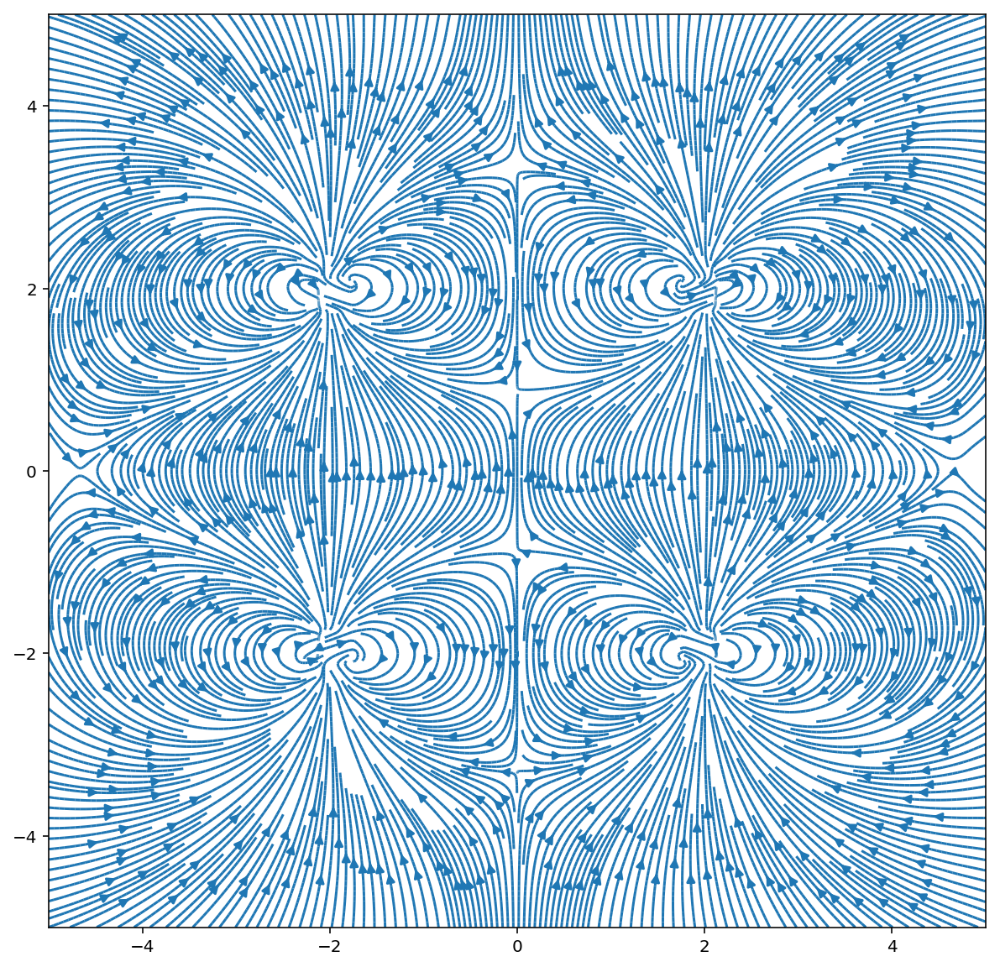

In [10]:
X = np.linspace(-5, 5)
Y = np.linspace(-5, 5)
Z = np.linspace(-5, 5)



Bx3D_1, By3D_1, Bz3D_1 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[-1.0, -1.0, 0])
Bx3D_2, By3D_2, Bz3D_2 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[-1.0, 1.0, 0])
Bx3D_3, By3D_3, Bz3D_3 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[1.0, -1.0, 0])
Bx3D_4, By3D_4, Bz3D_4 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[1.0, 1.0, 0])
Bx3D = Bx3D_1 + Bx3D_2 + Bx3D_3 + Bx3D_4
By3D = By3D_1 + By3D_2 + By3D_3 + By3D_4
Bz3D = Bz3D_1 + Bz3D_2 + Bz3D_3 + Bz3D_4


Bx_a, By_a, Bz_a = dipole(m=[1, 2, 3], r=[1, 1, 2], r0=[0, 0, 0])
Bx_b, By_b, Bz_b = dipole(m=[1, 2, 3], r=[1, 1, 2], r0=[0, 0, 0])
Bx_c, By_c, Bz_c = dipole(m=[1, 2, 3], r=[1, 1, 2], r0=[0, 0, 0])
Bx_d, By_d, Bz_d = dipole(m=[1, 2, 3], r=[1, 1, 2], r0=[0, 0, 0])

Bx1, By1 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[-2.0,-2.0])
Bx2, By2 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[-2.0,2.0])
Bx3, By3 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[2.0,-2.0])
Bx4, By4 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[2.0,2.0])
Bx = Bx1 + Bx2 + Bx3 + Bx4
By = By1 + By2 + By3 + By4


plt.figure(figsize=(10, 10))
plt.streamplot(X, Y, Bx, By, density=6)
plt.margins(0, 0)

Text(0.5,1,'Compare')

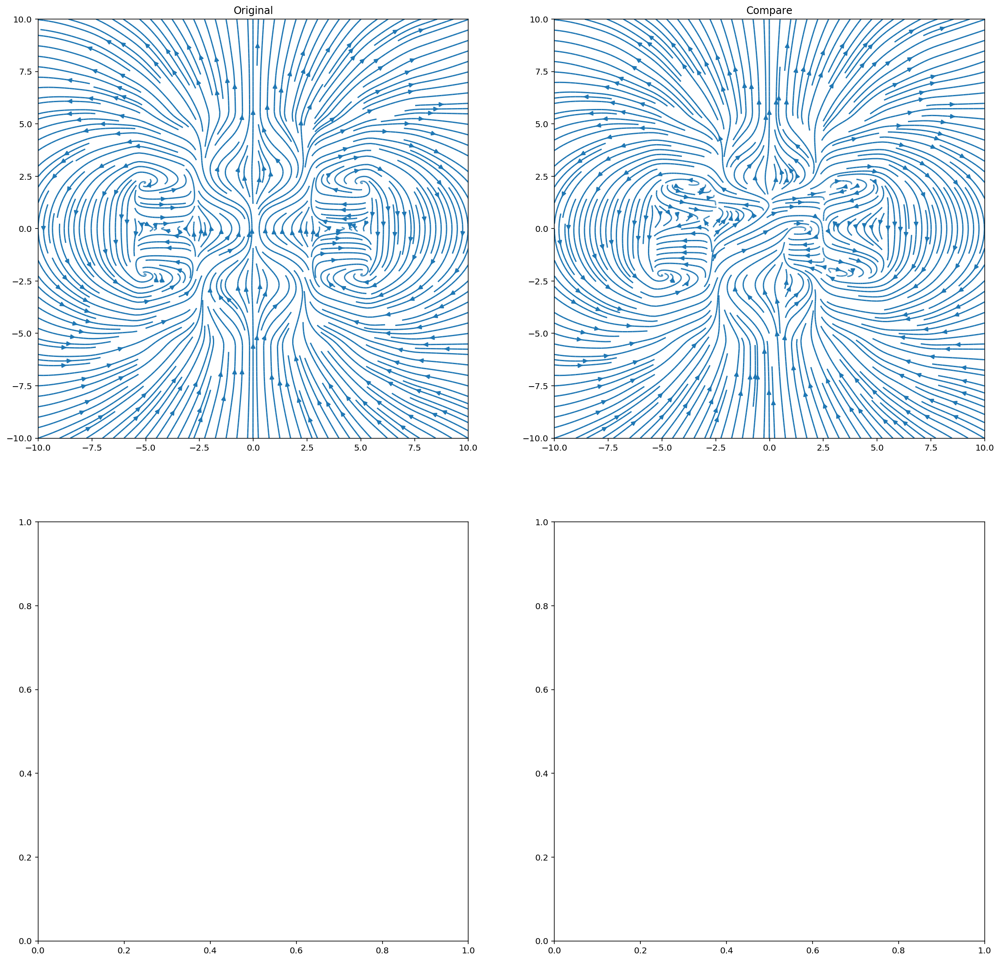

In [11]:
X = np.linspace(-10, 10, num = 10)
Y = np.linspace(-10, 10, num = 10)
Z = np.linspace(-10, 10, num = 10)
#print("X")
#print(X)
#print("Y")
#print(Y)
#print("Z")
#print(Z)

# Bx3D_1, By3D_1, Bz3D_1 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[-1.0, -1.0, 0])
# Bx3D_2, By3D_2, Bz3D_2 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[-1.0, 1.0, 0])
# Bx3D_3, By3D_3, Bz3D_3 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[1.0, -1.0, 0])
# Bx3D_4, By3D_4, Bz3D_4 = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, Z), r0=[1.0, 1.0, 0])
# Bx3D = Bx3D_1 + Bx3D_2 + Bx3D_3 + Bx3D_4
# By3D = By3D_1 + By3D_2 + By3D_3 + By3D_4
# Bz3D = Bz3D_1 + Bz3D_2 + Bz3D_3 + Bz3D_4

B3D = dipole(m=[1.0, 2.0, 3.0], r=[0.0,0.0,1.0], r0=[-1.0, -1.0, 0])
#print(B3D)

Bx3D_1_text, By3D_1_text, Bz3D_1_text = dipole(m=[1.0, 2.0, 3.0], r=[0.0,0.0,1.0], r0=[-1.0, -1.0, 0])
#print(Bx3D_1_text)
#print(By3D_1_text)
#print(Bz3D_1_text)

Bx3D_1, By3D_1, Bz3D_1 = dipole(m=[0.0, 0.1, 0.0], r=np.meshgrid(X, Y, 0.0), r0=[-2.0, -2.0, 0])
#print(Bx3D_1)

Bx3D_2, By3D_2, Bz3D_2 = dipole(m=[0.0, 0.1, 0.0], r=np.meshgrid(X, Y, 1.0), r0=[-2.0, 2.0, 0])
Bx3D_3, By3D_3, Bz3D_3 = dipole(m=[0.0, 0.1, 0.0], r=np.meshgrid(X, Y, 1.0), r0=[2.0, -2.0, 0])
Bx3D_4, By3D_4, Bz3D_4 = dipole(m=[0.0, 0.1, 0.0], r=np.meshgrid(X, Y, 1.0), r0=[2.0, 2.0, 0])
Bx3D = Bx3D_1 + Bx3D_2 + Bx3D_3 + Bx3D_4
By3D = By3D_1 + By3D_2 + By3D_3 + By3D_4
Bz3D = Bz3D_1 + Bz3D_2 + Bz3D_3 + Bz3D_4


Bx3D_1_a, By3D_1_a, Bz3D_1_a = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, 1.0), r0=[-1.0, -1.0, 0])
Bx3D_2_a, By3D_2_a, Bz3D_2_a = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, 1.0), r0=[-1.0, 1.0, 0])
Bx3D_3_a, By3D_3_a, Bz3D_3_a = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, 1.0), r0=[1.0, -1.0, 0])
Bx3D_4_a, By3D_4_a, Bz3D_4_a = dipole(m=[1.0, 2.0, 3.0], r=np.meshgrid(X, Y, 1.0), r0=[1.0, 1.0, 0])
Bx3D_a = Bx3D_1_a + Bx3D_2_a + Bx3D_3_a + Bx3D_4_a
By3D_a = By3D_1_a + By3D_2_a + By3D_3_a + By3D_4_a
Bz3D_a = Bz3D_1_a + Bz3D_2_a + Bz3D_3_a + Bz3D_4_a


Bx1, By1 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[-2.0,-2.0])
Bx2, By2 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[-2.0,2.0])
Bx3, By3 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[2.0,-2.0])
Bx4, By4 = dipole(m=[0, 0.1], r=np.meshgrid(X, Y), r0=[2.0,2.0])
Bx = Bx1 + Bx2 + Bx3 + Bx4
By = By1 + By2 + By3 + By4

#print("Bx")
#print(type(Bx))
#print(Bx.shape)
#print(Bx.dtype)
#print(Bx)
#print("Bx3D")
#print(type(Bx3D))
#print(Bx3D.shape)
#print(Bx3D.dtype)
#print(Bx3D)
#########
#print(Bx3D.transpose(2,0,1))
#print(Bx3D.reshape(10,-1))
#print(Bx3D.transpose(2,0,1).shape)
#print(Bx3D.transpose(2,0,1).dtype)
#print(Bx3D.reshape(2,-1).transpose(1,0))
#np.array([[1,2,3],[4,5,6]]).tolist()
#print("B3D")
#print(B3D)

fig, ax = plt.subplots(2,2,figsize=(20, 20))
ax[0,0].streamplot(X, Y, Bx, By, density=3)
ax[0,0].margins(0, 0)
ax[0,0].set_title('Original')

#ax[1,1] = fig.gca(projection='3d')
#ax[0,1].streamplot(X, Y, Bx3D, By3D, density=3)
#ax[0,1].quiver(X, Y, B3D[0], B3D[1])
ax[0,1].streamplot(X, Y, Bx3D.reshape(10,-1), By3D.reshape(10,-1), density=3)
ax[0,1].margins(0, 0)
ax[0,1].set_title('Compare')

[  5.30330086e-08   1.76776695e-08   0.00000000e+00]
[  5.30330086e-08   1.76776695e-08]
[-2.5        -1.94444444 -1.38888889 -0.83333333 -0.27777778  0.27777778
  0.83333333  1.38888889  1.94444444  2.5       ]
[[[ -8.24878230e-09]
  [ -1.06849832e-08]
  [ -9.08877735e-09]
  [ -2.73485294e-09]
  [  4.25624265e-10]
  [ -4.25624265e-10]
  [  2.73485294e-09]
  [  9.08877735e-09]
  [  1.06849832e-08]
  [  8.24878230e-09]]

 [[ -1.56684729e-08]
  [ -2.57415222e-08]
  [ -2.52123110e-08]
  [  3.68978860e-10]
  [  7.26647023e-09]
  [ -7.26647023e-09]
  [ -3.68978860e-10]
  [  2.52123110e-08]
  [  2.57415222e-08]
  [  1.56684729e-08]]

 [[ -2.52345939e-08]
  [ -5.31357033e-08]
  [ -6.83457025e-08]
  [  1.91249428e-08]
  [  2.98533916e-08]
  [ -2.98533916e-08]
  [ -1.91249428e-08]
  [  6.83457025e-08]
  [  5.31357033e-08]
  [  2.52345939e-08]]

 [[ -2.97071251e-08]
  [ -6.44233039e-08]
  [ -8.83095212e-08]
  [  2.79691080e-08]
  [  3.90615772e-08]
  [ -3.90615772e-08]
  [ -2.79691080e-08]
  [  

Text(0.5,1,'Compare @2.0')

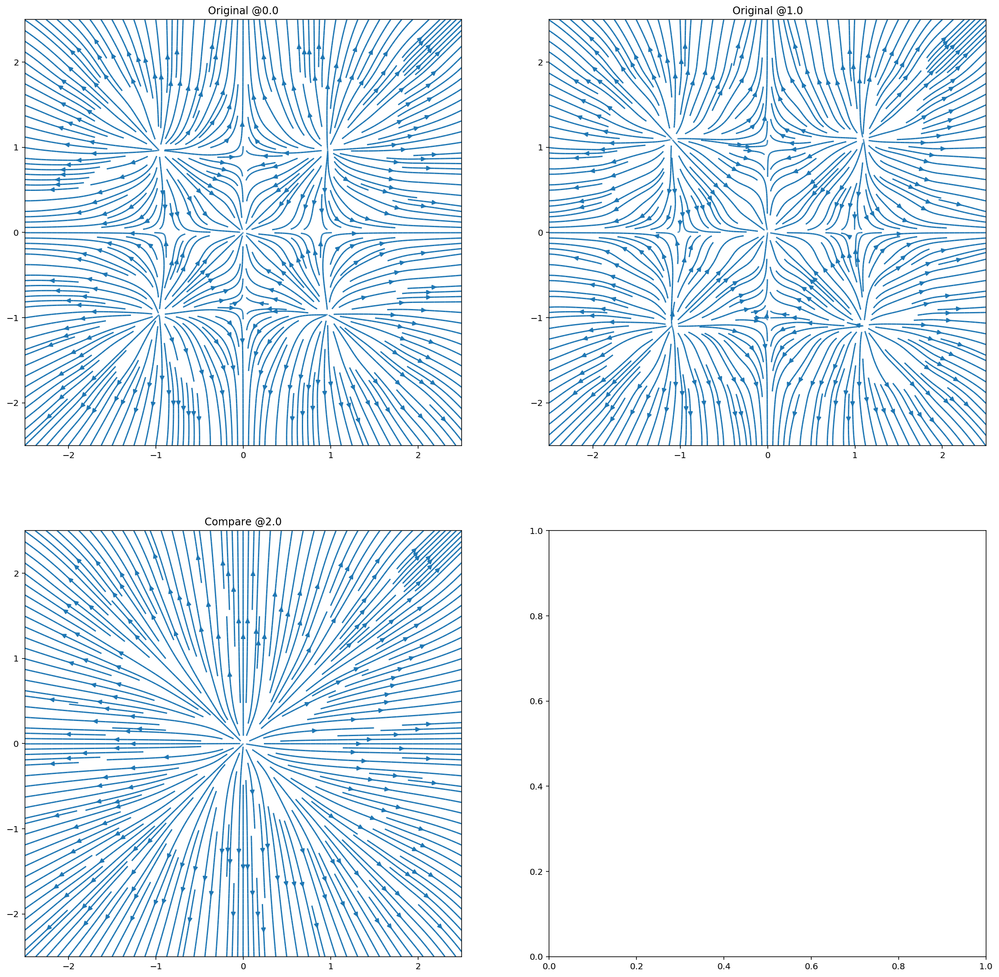

In [17]:
X_1 = np.linspace(-2.5, 2.5, num = 10)
Y_1 = np.linspace(-2.5, 2.5, num = 10)
Z_1 = np.linspace(-2.5, 2.5, num = 10)
#print(X_1)
# Compare the two formulae 2D and 3D in the same points

Bx1, By1 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[-2.0,-2.0])
Bx2, By2 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[-2.0,2.0])
Bx3, By3 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[2.0,-2.0])
Bx4, By4 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[2.0,2.0])
Bx = Bx1 + Bx2 + Bx3 + Bx4
By = By1 + By2 + By3 + By4

Bx3D_0_1, By3D_0_1, Bz3D_0_1 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[-1.0, -1.0, 0])
Bx3D_0_2, By3D_0_2, Bz3D_0_2 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[-1.0, 1.0, 0])
Bx3D_0_3, By3D_0_3, Bz3D_0_3 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[1.0, -1.0, 0])
Bx3D_0_4, By3D_0_4, Bz3D_0_4 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[1.0, 1.0, 0])
Bx3D_total_0 = Bx3D_0_1 + Bx3D_0_2 + Bx3D_0_3 + Bx3D_0_4
By3D_total_0 = By3D_0_1 + By3D_0_2 + By3D_0_3 + By3D_0_4
Bz3D_total_0 = Bz3D_0_1 + Bz3D_0_2 + Bz3D_0_3 + Bz3D_0_4

Bx3D_1_1, By3D_1_1, Bz3D_1_1 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[-1.0, -1.0, 0])
Bx3D_1_2, By3D_1_2, Bz3D_1_2 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[-1.0, 1.0, 0])
Bx3D_1_3, By3D_1_3, Bz3D_1_3 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[1.0, -1.0, 0])
Bx3D_1_4, By3D_1_4, Bz3D_1_4 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[1.0, 1.0, 0])
Bx3D_total_1 = Bx3D_1_1 + Bx3D_1_2 + Bx3D_1_3 + Bx3D_1_4
By3D_total_1 = By3D_1_1 + By3D_1_2 + By3D_1_3 + By3D_1_4
Bz3D_total_1 = Bz3D_1_1 + Bz3D_1_2 + Bz3D_1_3 + Bz3D_1_4



Bx3D_2_1, By3D_2_1, Bz3D_2_1 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[-1.0, -1.0, 0])
Bx3D_2_2, By3D_2_2, Bz3D_2_2 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[-1.0, 1.0, 0])
Bx3D_2_3, By3D_2_3, Bz3D_2_3 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[1.0, -1.0, 0])
Bx3D_2_4, By3D_2_4, Bz3D_2_4 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[1.0, 1.0, 0])
Bx3D_total_2 = Bx3D_2_1 + Bx3D_2_2 + Bx3D_2_3 + Bx3D_2_4
By3D_total_2 = By3D_2_1 + By3D_2_2 + By3D_2_3 + By3D_2_4
Bz3D_total_2 = Bz3D_2_1 + Bz3D_2_2 + Bz3D_2_3 + Bz3D_2_4

#print(Bx)
print(dipole(m=[0, 1.0, 0.0], r=[1.0, 1.0, 0], r0=[0, 0, 0]))
#Problem avec la formule pour un dipole vers le Z...print (dipole(m=[0, 0, 1.0], r=[1.0, 1.0], r0=[0.0,0.0]))
print (dipole(m=[0, 1.0], r=[1.0, 1.0], r0=[0.0,0.0]))
print(X_1)
print(Bx3D_total_0)
#print(Bx3D_total_1.reshape(10,-1))
fig, ax = plt.subplots(2,2,figsize=(20, 20))
ax[0,0].streamplot(X_1, Y_1, Bx3D_total_0.reshape(10,-1), By3D_total_0.reshape(10,-1), density=3)
ax[0,0].margins(0, 0)
ax[0,0].set_title('Original @0.0')

ax[0,1].streamplot(X_1, Y_1, Bx3D_total_1.reshape(10,-1), By3D_total_1.reshape(10,-1), density=3)
ax[0,1].margins(0, 0)
ax[0,1].set_title('Original @1.0')

# ax[1,1] = fig.gca(projection='3d')
# ax[0,1].streamplot(X, Y, Bx3D, By3D, density=3)
#ax[0,1].quiver(X, Y, B3D[0], B3D[1])
ax[1,0].streamplot(X_1, Y_1, Bx3D_total_2.reshape(10,-1), By3D_total_2.reshape(10,-1), density=3)
ax[1,0].margins(0, 0)
ax[1,0].set_title('Compare @2.0')



In [13]:
import SharedArray as sa

# Create an array in shared memory.
#a = sa.create("shm://test", 10)
sa.delete("file://test")
a = sa.create("file://test", 10)

# Attach it as a different array. This can be done from another
# python interpreter as long as it runs on the same computer.
#b = sa.attach("shm://test")
b = sa.attach("file://test")

# See how they are actually sharing the same memory.
a[0] = 42
a = Bx,By
print(b[0])
print(a[0])

# Destroying a does not affect b.
del a
print(b[0])


# See how "test" is still present in shared memory even though we
# destroyed the array a. This method only works on Linux.
#sa.list()

# Now destroy the array "test" from memory.
#sa.delete("file://test")

# The array b is still there, but once you destroy it then the
# data is gone for real.
print(b[0])

42.0
[[  2.61061432e-10   3.84731495e-10   3.52444071e-10   3.93951906e-11
   -6.86114740e-11   6.86114740e-11  -3.93951906e-11  -3.52444071e-10
   -3.84731495e-10  -2.61061432e-10]
 [  3.84731495e-10   8.86655461e-10   1.36697184e-09  -5.21447648e-10
   -6.19549561e-10   6.19549561e-10   5.21447648e-10  -1.36697184e-09
   -8.86655461e-10  -3.84731495e-10]
 [  3.52444071e-10   1.36697184e-09   1.14039620e-08  -1.77635983e-08
   -2.38628645e-09   2.38628645e-09   1.77635983e-08  -1.14039620e-08
   -1.36697184e-09  -3.52444071e-10]
 [  3.93951906e-11  -5.21447648e-10  -1.77635983e-08   1.43188309e-07
    1.78344225e-09  -1.78344225e-09  -1.43188309e-07   1.77635983e-08
    5.21447648e-10  -3.93951906e-11]
 [ -6.86114740e-11  -6.19549561e-10  -2.38628645e-09   1.78344225e-09
    1.06143272e-09  -1.06143272e-09  -1.78344225e-09   2.38628645e-09
    6.19549561e-10   6.86114740e-11]
 [  6.86114740e-11   6.19549561e-10   2.38628645e-09  -1.78344225e-09
   -1.06143272e-09   1.06143272e-09   1.

Text(0.5,1,'Compare @2.0')

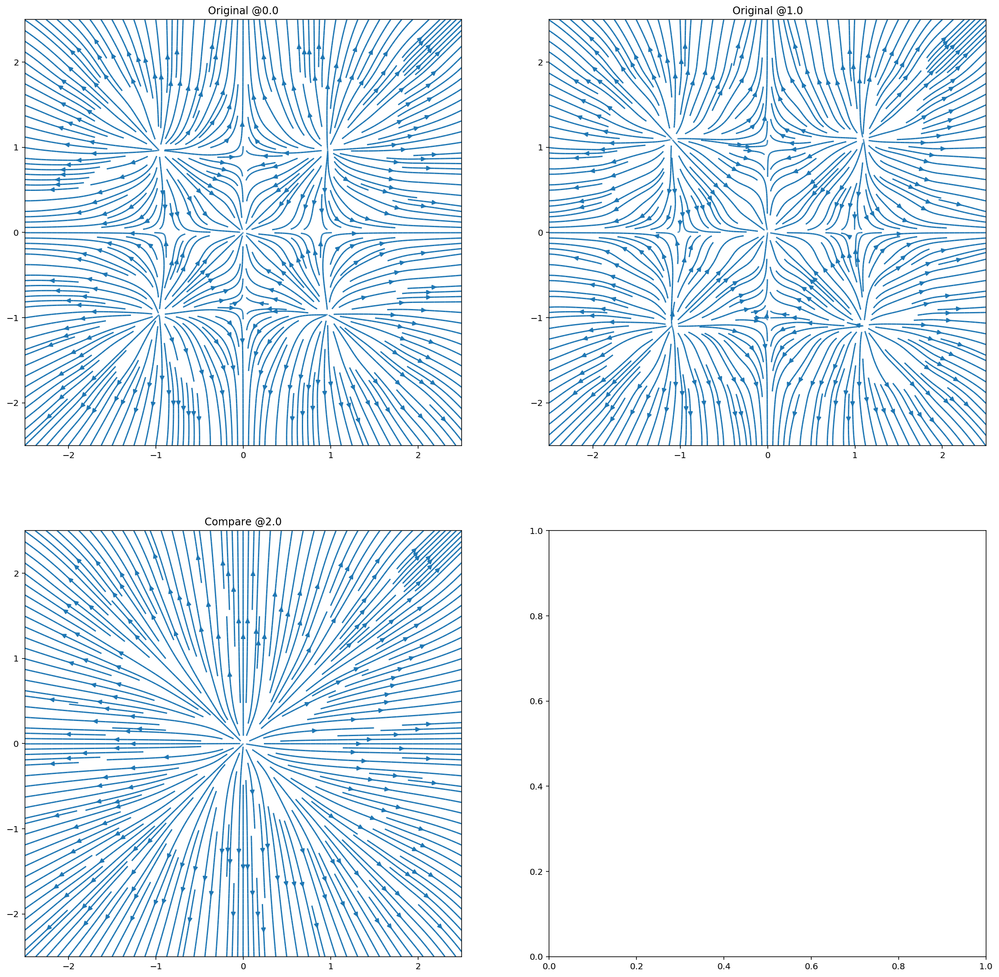

In [20]:
#Number of measures
numberOfMeasures = 10
X_1 = np.linspace(-2.5, 2.5, num = numberOfMeasures)
Y_1 = np.linspace(-2.5, 2.5, num = numberOfMeasures)
Z_1 = np.linspace(0.1, 5.1, num = numberOfMeasures)
#print(X_1)
# Compare the two formulae 2D and 3D in the same points

Bx1, By1 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[-2.0,-2.0])
Bx2, By2 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[-2.0,2.0])
Bx3, By3 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[2.0,-2.0])
Bx4, By4 = dipole(m=[0, 0.1], r=np.meshgrid(X_1, Y_1), r0=[2.0,2.0])
Bx = Bx1 + Bx2 + Bx3 + Bx4
By = By1 + By2 + By3 + By4

Bx3D_0_1, By3D_0_1, Bz3D_0_1 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[-1.0, -1.0, 0])
Bx3D_0_2, By3D_0_2, Bz3D_0_2 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[-1.0, 1.0, 0])
Bx3D_0_3, By3D_0_3, Bz3D_0_3 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[1.0, -1.0, 0])
Bx3D_0_4, By3D_0_4, Bz3D_0_4 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 1.0), r0=[1.0, 1.0, 0])
Bx3D_total_0 = Bx3D_0_1 + Bx3D_0_2 + Bx3D_0_3 + Bx3D_0_4
By3D_total_0 = By3D_0_1 + By3D_0_2 + By3D_0_3 + By3D_0_4
Bz3D_total_0 = Bz3D_0_1 + Bz3D_0_2 + Bz3D_0_3 + Bz3D_0_4

Bx3D_1_1, By3D_1_1, Bz3D_1_1 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[-1.0, -1.0, 0])
Bx3D_1_2, By3D_1_2, Bz3D_1_2 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[-1.0, 1.0, 0])
Bx3D_1_3, By3D_1_3, Bz3D_1_3 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[1.0, -1.0, 0])
Bx3D_1_4, By3D_1_4, Bz3D_1_4 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 0.5), r0=[1.0, 1.0, 0])
Bx3D_total_1 = Bx3D_1_1 + Bx3D_1_2 + Bx3D_1_3 + Bx3D_1_4
By3D_total_1 = By3D_1_1 + By3D_1_2 + By3D_1_3 + By3D_1_4
Bz3D_total_1 = Bz3D_1_1 + Bz3D_1_2 + Bz3D_1_3 + Bz3D_1_4



Bx3D_2_1, By3D_2_1, Bz3D_2_1 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[-1.0, -1.0, 0])
Bx3D_2_2, By3D_2_2, Bz3D_2_2 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[-1.0, 1.0, 0])
Bx3D_2_3, By3D_2_3, Bz3D_2_3 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[1.0, -1.0, 0])
Bx3D_2_4, By3D_2_4, Bz3D_2_4 = dipole(m=[0.0, 0.0, 1.0], r=np.meshgrid(X_1, Y_1, 2.0), r0=[1.0, 1.0, 0])
Bx3D_total_2 = Bx3D_2_1 + Bx3D_2_2 + Bx3D_2_3 + Bx3D_2_4
By3D_total_2 = By3D_2_1 + By3D_2_2 + By3D_2_3 + By3D_2_4
Bz3D_total_2 = Bz3D_2_1 + Bz3D_2_2 + Bz3D_2_3 + Bz3D_2_4

#print(Bx)
#print(dipole(m=[0, 1.0, 0.0], r=[1.0, 1.0, 0], r0=[0, 0, 0]))
#Problem avec la formule pour un dipole vers le Z...print (dipole(m=[0, 0, 1.0], r=[1.0, 1.0], r0=[0.0,0.0]))
#print (dipole(m=[0, 1.0], r=[1.0, 1.0], r0=[0.0,0.0]))
#print(X_1)
#print(Bx3D_total_0)
#print(Bx3D_total_1.reshape(10,-1))
fig, ax = plt.subplots(2,2,figsize=(20, 20))
ax[0,0].streamplot(X_1, Y_1, Bx3D_total_0.reshape(numberOfMeasures,-1), By3D_total_0.reshape(numberOfMeasures,-1), density=3)
ax[0,0].margins(0, 0)
ax[0,0].set_title('Original @0.0')

ax[0,1].streamplot(X_1, Y_1, Bx3D_total_1.reshape(numberOfMeasures,-1), By3D_total_1.reshape(numberOfMeasures,-1), density=3)
ax[0,1].margins(0, 0)
ax[0,1].set_title('Original @1.0')

# ax[1,1] = fig.gca(projection='3d')
# ax[0,1].streamplot(X, Y, Bx3D, By3D, density=3)
#ax[0,1].quiver(X, Y, B3D[0], B3D[1])
ax[1,0].streamplot(X_1, Y_1, Bx3D_total_2.reshape(numberOfMeasures,-1), By3D_total_2.reshape(numberOfMeasures,-1), density=3)
ax[1,0].margins(0, 0)
ax[1,0].set_title('Compare @2.0')



